# Local Model-Agnostic
In this lab, we will try and explain a models output using local model-agnostic techniques.
Libraries SHAP and LIME will be introduced and used on models that have been trained on the [Wine Quality dataset](https://archive.ics.uci.edu/ml/datasets/wine+quality).
The two models we use are logistic regression form scikit-learn and a gradient boosted classification trees using xgboost.

The student is then to apply the methods and try to explain a black box model's output and identify whether improvements can be made for the explainability of the model.

## Installation for Google Colab
Run the cell below to install the required packages to use the notebook in Google Colab.

You might get an error saying Google Colab requires Pandas 1.5.1. Ignore that and just restart the session from the menu above: **Runtime** -> **Restart Session**.

After you installed the packages and restarted the session, you can continue with the lab.

**Remember, if you take a longer break or divide your work over several days you will have to reinstall the packages by running the cell below again and restarting the session.**

In [1]:
%pip install -U scikit-learn==1.4.1.post1 shap==0.45.0 lime==0.2.0.1 graphviz==0.20.2 dtreeviz==2.2.2 eli5==0.13.0 xgboost==2.0.3 pandas==2.2.1 seaborn==0.13.2 numpy==1.26.4

Note: you may need to restart the kernel to use updated packages.


## Load packages

In [1]:
import pandas as pd
import numpy as np

import shap
import lime
import time
import xgboost

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

## Load the dataset and process

In [2]:
# Dataset originally from https://archive.ics.uci.edu/dataset/186/wine+quality
wine = pd.read_csv('https://raw.githubusercontent.com/christiannordahl/xaidata/main/winequality-red.csv', sep=';')
wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


The **quality** column is based on a sensory test ranging from 1 to 10, where a higher value is considered to be a better wine.
We remake that column to be a binary classification problem, where 0 is a lower quality wine and 1 is a higher quality wine.

In [3]:
wine['quality'] = np.where(wine['quality'] > 5, 1, 0)
wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0


Divide the dataset and train the two models.

In [4]:
X_train, X_test, Y_train, Y_test = train_test_split(wine.iloc[:,:11].values, wine['quality'], test_size=0.3, random_state=42)
lr = LogisticRegression(max_iter=1000)
xgb = xgboost.XGBClassifier(n_estimators=500, max_depth=2)
lr.fit(X_train, Y_train)
xgb.fit(X_train, Y_train)
print(accuracy_score(lr.predict(X_test), Y_test))
print(accuracy_score(xgb.predict(X_test), Y_test))

0.725
0.7916666666666666


## SHAP
Calculate the shap values.

In [5]:
mask = shap.maskers.Independent(X_train)
lr_explainer = shap.LinearExplainer(lr, mask, feature_names=wine.columns[:11])
lr_shap_values = lr_explainer.shap_values(X_test)
lr_shaps = lr_explainer(X_test)

xgb_explainer = shap.TreeExplainer(xgb, X_train, feature_names=wine.columns[:11])
xgb_shap_values = xgb_explainer.shap_values(X_test)
xgb_shaps = xgb_explainer(X_test)

### Overall view
To give an initial glance of the effect each feature has on the models, we can plot out the summary plot from the SHAP library.
These plots are gathered from each individual instance.
The produced plot sorts the features in descending order of the contribution
 it has on the classifications.

It's clear that the alcohol level is the major contributor in both the models and the top 5 attributes generally agree with eachother, but the order and magnitude of their contribution differs between the models.

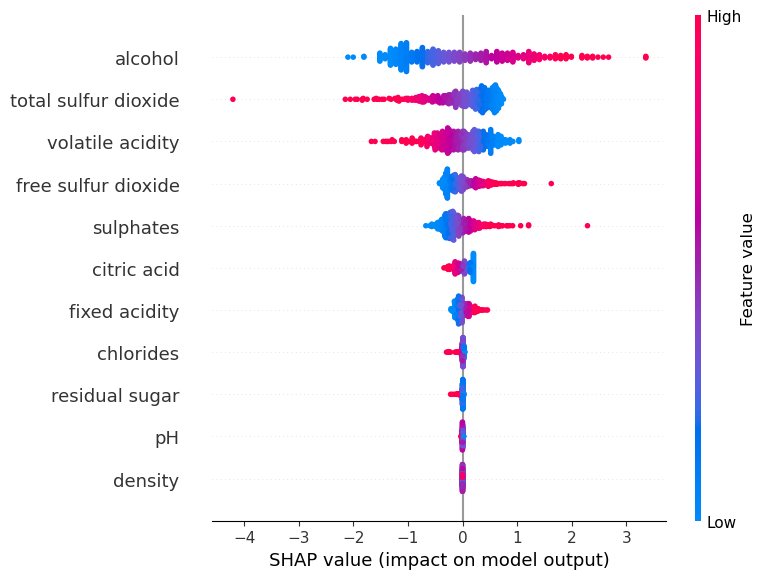

In [6]:
shap.summary_plot(lr_shap_values, X_test, feature_names=wine.columns)

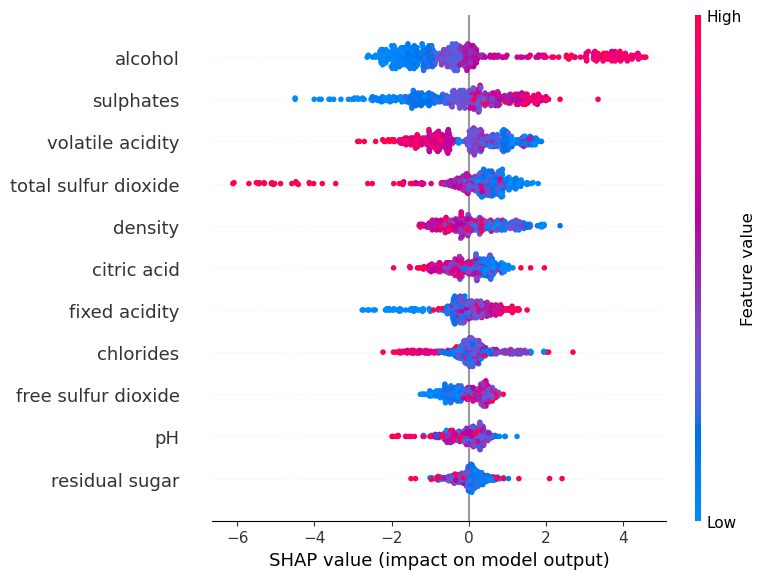

In [7]:
shap.summary_plot(xgb_shap_values, X_test, feature_names=wine.columns)

The barplot also provides the average information of the contribution.

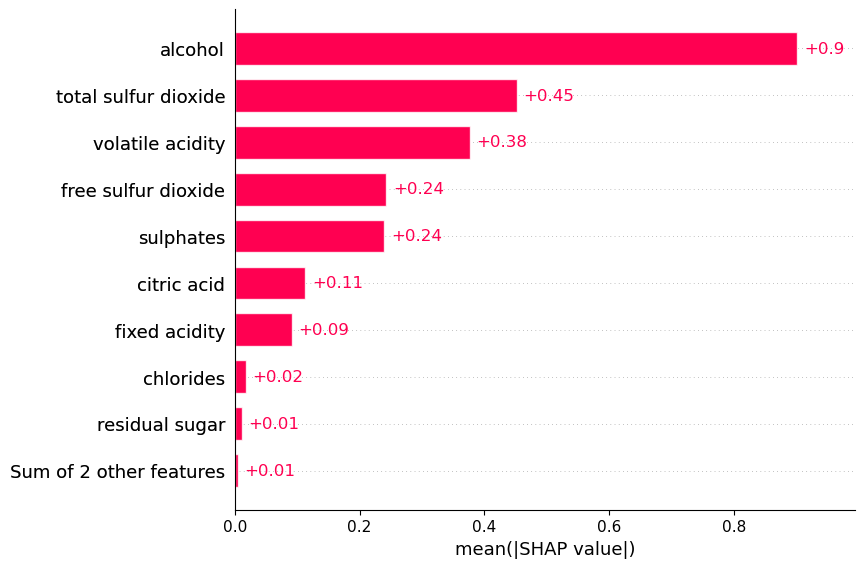

In [8]:
shap.plots.bar(lr_shaps)

If we divide into cohorts it provides some additional information. The features are divided into the groups where the most prominent feature contributes the most.

So, when for an instance which has alcohol over 10.775 the features contrubtions are available in the red and white bars.

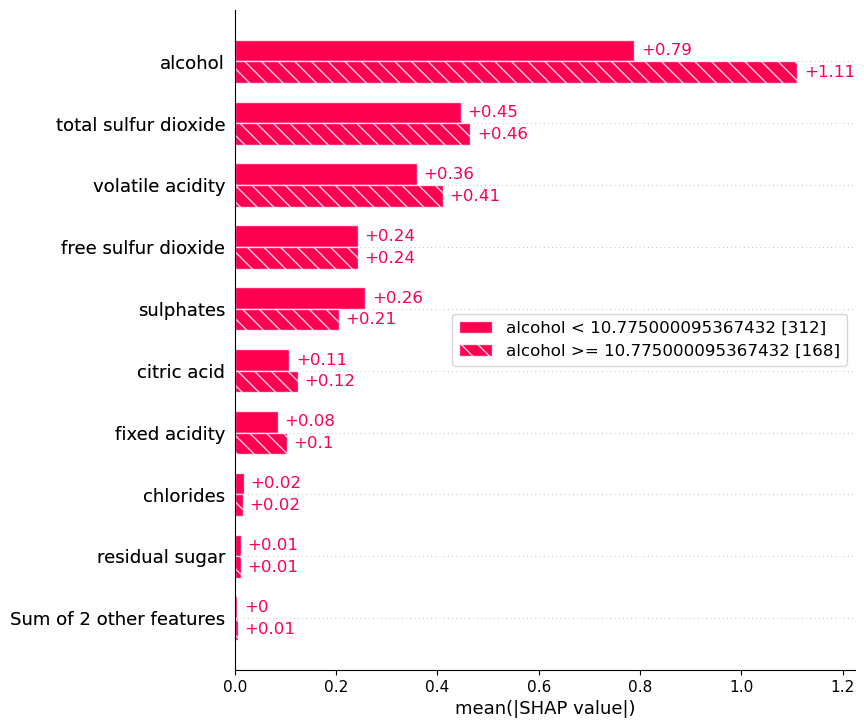

In [9]:
shap.plots.bar(lr_shaps.cohorts(2).abs.mean(0))

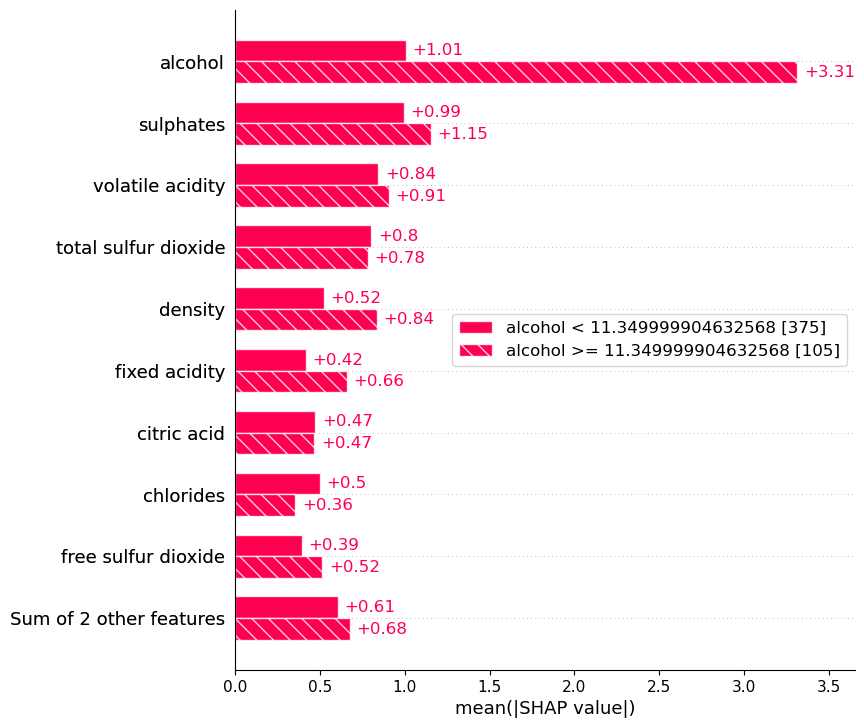

In [11]:
shap.plots.bar(xgb_shaps.cohorts(2).abs.mean(0))

### Individual instances
When we instead look at an individual data instance and its contribution to the prediction, we have a lot of options to visualize with. In all cells below there are various graphs that visualize the same things, you can use whichever you prefer for your visual aid later on.

In [10]:
shap.initjs()
ind = 10
shap.force_plot(
    lr_explainer.expected_value, lr_shap_values[ind], X_test[ind,:],
    feature_names=wine.columns[:11]
)

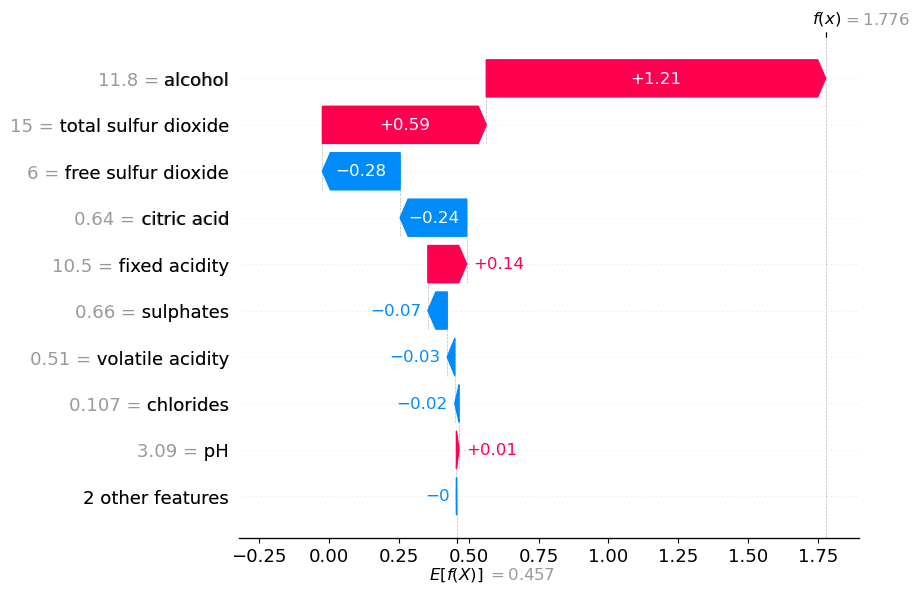

In [11]:
shap.plots.waterfall(lr_shaps[ind])

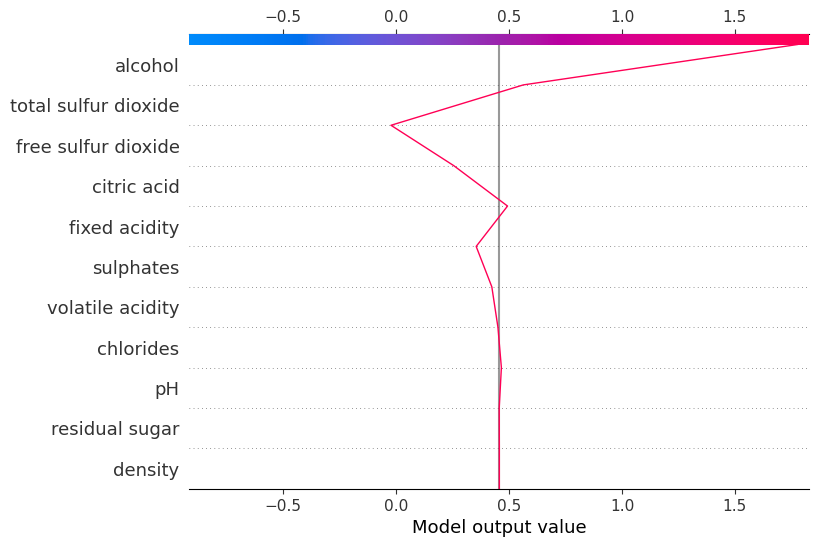

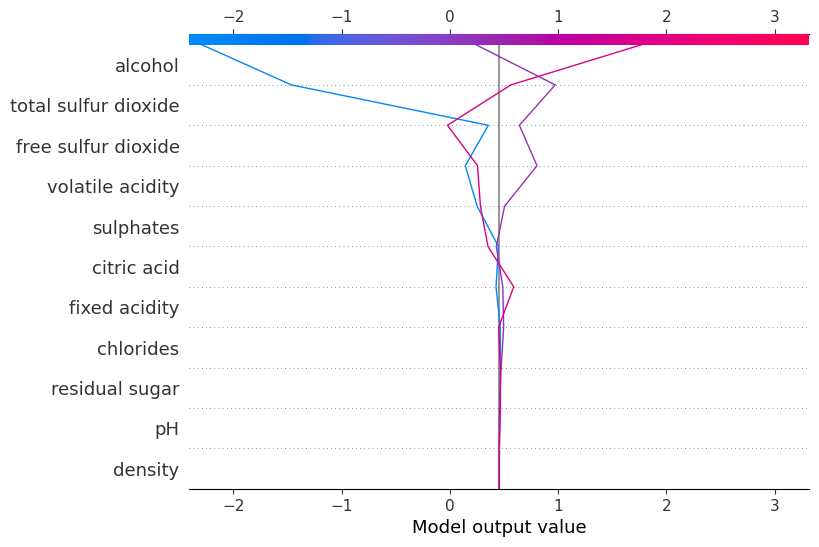

In [12]:
shap.decision_plot(lr_explainer.expected_value, lr_shap_values[10], wine.columns[:11])

# to view multiple instances at once. Comment out below to view.
shap.decision_plot(lr_explainer.expected_value, lr_shap_values[[6,8,10]], wine.columns[:11])

In [14]:
shap.initjs()
shap.force_plot(
    xgb_explainer.expected_value, xgb_shap_values[ind], X_test[ind,:],
    feature_names=wine.columns[:11]
)

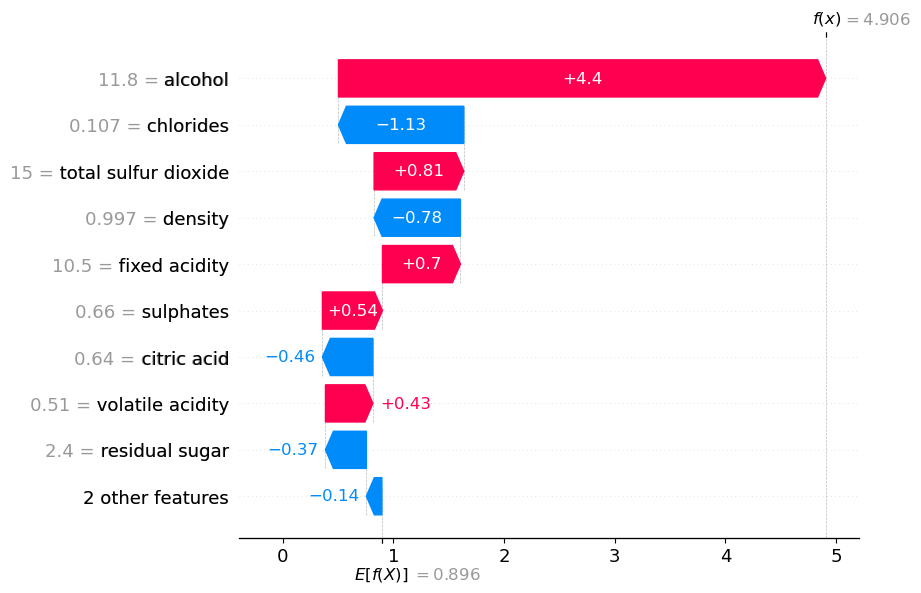

In [15]:
xgb_shaps = xgb_explainer(X_test)
shap.plots.waterfall(xgb_shaps[ind])

### Correlated Features
Using hierarchical clustering, we can view how features are correlated to each other. This is built into shap.

We can use this information to simplify, and perhaps better the model, as correlated features often divide the importance.

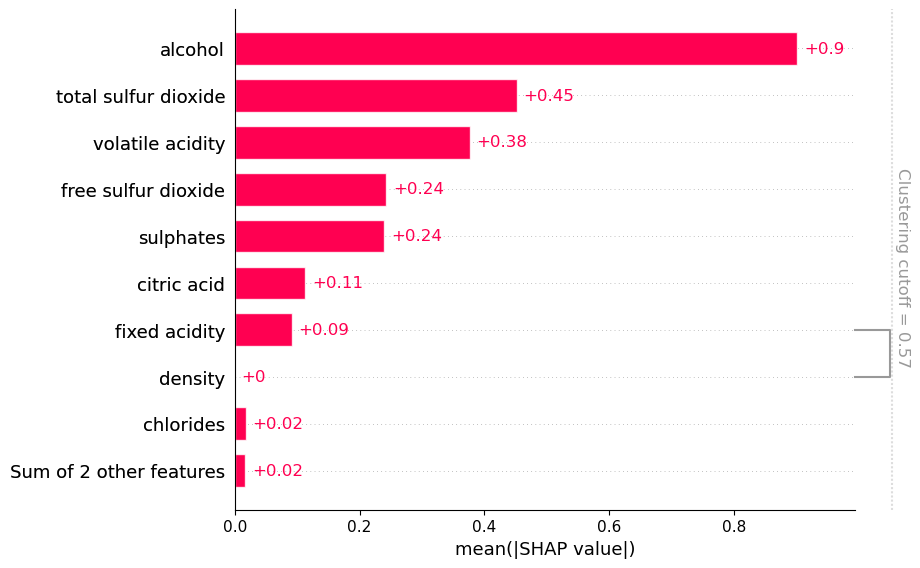

In [18]:
clustering = shap.utils.hclust(X_test, Y_test)
shap.plots.bar(lr_shaps, clustering=clustering, clustering_cutoff=0.57) # A higher cut off value means a larger distance between the features. I.e., larger means more independant and less redundant.

We see that the density feature is correlated to alcohol. If we remove density, we are likely to increase the importance of the alcohol feature.

Below we remove the density feature and retrain the model. We then look into if the predictive performance has changed and we visualize the same instance as before using the SHAP library.

In [20]:
cols = wine.drop('density', axis=1).columns
wine_without_density = wine[cols]


X_test_new = np.concatenate((X_test[:,:7], X_test[:,8:]), axis=1)
X_train_new = np.concatenate((X_train[:,:7], X_train[:,8:]), axis=1)

lr_new = LogisticRegression(max_iter=1000)
xgb_new = xgboost.XGBClassifier(n_estimators=500, max_depth=2)
lr_new.fit(X_train_new, Y_train)
xgb_new.fit(X_train_new, Y_train)
print(accuracy_score(lr_new.predict(X_test_new), Y_test))
print(accuracy_score(xgb_new.predict(X_test_new), Y_test))

cols = list(wine.columns[:7]) + list(wine.columns[8:])

mask_new = shap.maskers.Independent(X_train_new)
lr_explainer_new = shap.LinearExplainer(lr_new, mask_new, feature_names=cols)
lr_shap_values_new = lr_explainer_new.shap_values(X_test_new)
lr_shaps_new = lr_explainer_new(X_test_new)

xgb_explainer_new = shap.TreeExplainer(xgb_new, X_train_new, feature_names=cols)
xgb_shap_values_new = xgb_explainer_new.shap_values(X_test_new)
xgb_shaps_new = xgb_explainer_new(X_test_new)

0.725
0.7645833333333333


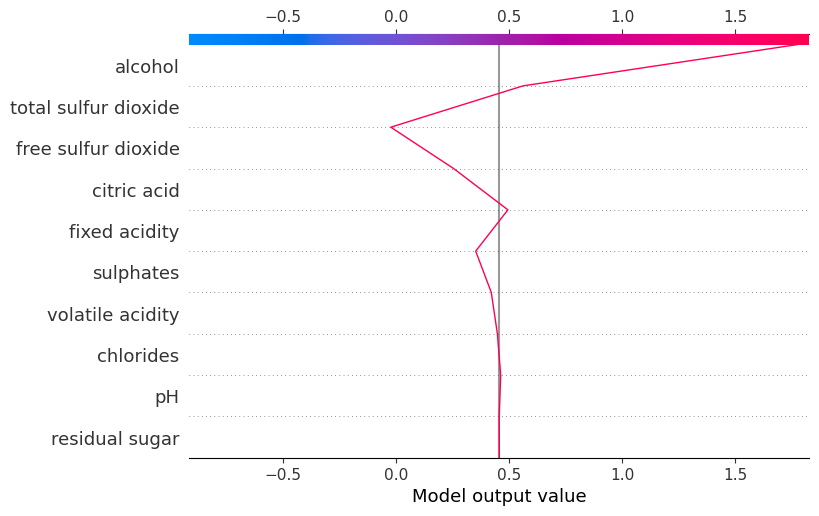

In [21]:
shap.decision_plot(lr_explainer_new.expected_value, lr_shap_values_new[ind], feature_names=cols[:-1])

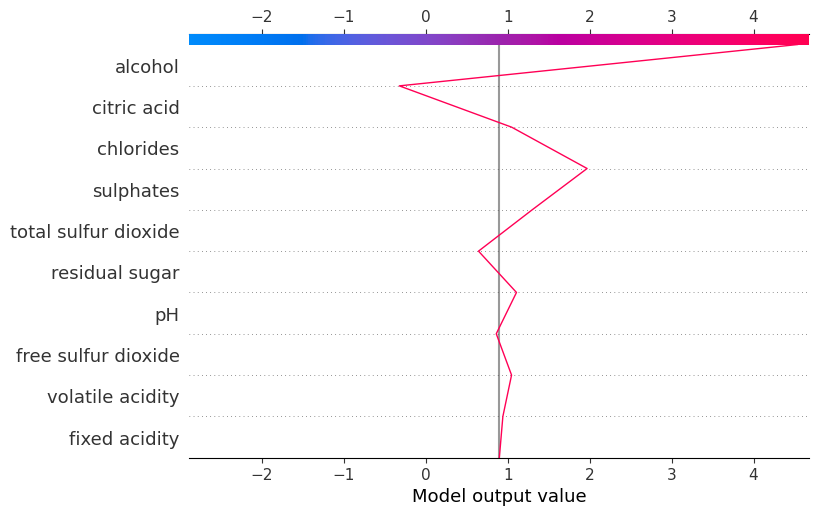

In [22]:
shap.decision_plot(xgb_explainer_new.expected_value, xgb_shap_values_new[ind], feature_names=cols[:-1])

There are also additional functions you can look into at the [shap documentation](https://shap.readthedocs.io/en/latest/api.html) and examples via their [github page](https://github.com/shap/shap).

## LIME

Here we use LIME to get an interpretable model from our previously trained models.

In [36]:
lime_explainer = lime.lime_tabular.LimeTabularExplainer(X_train ,class_names=['Low Quality', 'High Quality'], feature_names = wine.columns[:11],
                                                   #categorical_features=categorical_features,
                                                   #categorical_names=categorical_names,
                                                   kernel_width=3, verbose=False)

Using the same data instance as before, we show the contribution of each feature for the prediction. This example limits the number of features to 5. Try and see what happens if you increase/decrease the number of features to include.

In [37]:
ind = 10
exp = lime_explainer.explain_instance(X_test[ind], lr.predict_proba, num_features=3)
exp.show_in_notebook()

exp = lime_explainer.explain_instance(X_test[ind], lr.predict_proba, num_features=4)
exp.show_in_notebook()

exp = lime_explainer.explain_instance(X_test[ind], lr.predict_proba, num_features=5)
exp.show_in_notebook()

exp = lime_explainer.explain_instance(X_test[ind], lr.predict_proba, num_features=6)
exp.show_in_notebook()

We can also grab the rules we get from the interpretable model LIME creates.

In [38]:
exp.as_list()

[('alcohol > 11.00', 0.38059007971940856),
 ('total sulfur dioxide <= 22.00', 0.14361413033163462),
 ('free sulfur dioxide <= 7.00', -0.06603366022024383),
 ('citric acid > 0.43', -0.06002447896016773),
 ('0.40 < volatile acidity <= 0.52', 0.05241145772223999),
 ('fixed acidity > 9.20', 0.03892786690537996)]

The code below just grabs the data instance and its corresponding feature values for you to compare against the rules above.

In [39]:
list(zip(X_test[ind], wine.columns))

[(10.5, 'fixed acidity'),
 (0.51, 'volatile acidity'),
 (0.64, 'citric acid'),
 (2.4, 'residual sugar'),
 (0.107, 'chlorides'),
 (6.0, 'free sulfur dioxide'),
 (15.0, 'total sulfur dioxide'),
 (0.9973, 'density'),
 (3.09, 'pH'),
 (0.66, 'sulphates'),
 (11.8, 'alcohol')]

There are also more functions in LIME that you can look into through the [LIME documentation](https://lime-ml.readthedocs.io/en/latest/) and examples via the [github page](https://github.com/marcotcr/lime).

# Assignment

Here you are to apply the techniques from above to try and explain the output produced by a model.

Think about questions such as, but not limited to:
- Which parts of the data are mostly influencing the models output?
- Are some parts unecessary of the data?
- What can you do to improve explainability of the model?
- Etc.

Investigate, analyze, and possibly improve the model using the SHAP and LIME modules. Explain and show your steps as you go along.

## Load the data, create and train your model

from sklearn.datasets import load_breast_cancer
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from joblib import load, dump
import pickle

# Import dataset
scaler = MinMaxScaler()
dataset = load_breast_cancer()
X_train, X_test, y_train, y_test = train_test_split(dataset['data'], dataset['target'], test_size=0.2, random_state=42)
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Creating and training the model
clf = MLPClassifier(hidden_layer_sizes = [100,100], alpha = 5, solver = 'lbfgs', max_iter = 1000).fit(X_train_scaled, y_train)

print('Training score:', clf.score(X_train_scaled, y_train))
print('Testing score:', clf.score(X_test_scaled, y_test))

# Output is
#Training score: 0.9802197802197802
#Testing score: 0.9736842105263158

## Students code and text below


In [2]:
#First let's see what the data looks like, features and balance
from sklearn.datasets import load_breast_cancer

# Display all feature names
print("All Feature Names:")
print(list(load_breast_cancer()['feature_names']))

# Calculate the total number of datapoints
total_datapoints = len(load_breast_cancer()['target'])

# Calculate the sum of all target values
total_positive = load_breast_cancer()['target'].sum()

# Calculate the percent of positive cases
percent_positive = total_positive / total_datapoints *100

print(f'Total datapoints: {total_datapoints}')
print(f'Total benign cases: {total_positive}')
print(f'Proportion of benign cases: {percent_positive:.2f} %')
print('Curiously, the benign cases are classified as 1, whereas malignant is 0, see DESCR')

All Feature Names:
['mean radius', 'mean texture', 'mean perimeter', 'mean area', 'mean smoothness', 'mean compactness', 'mean concavity', 'mean concave points', 'mean symmetry', 'mean fractal dimension', 'radius error', 'texture error', 'perimeter error', 'area error', 'smoothness error', 'compactness error', 'concavity error', 'concave points error', 'symmetry error', 'fractal dimension error', 'worst radius', 'worst texture', 'worst perimeter', 'worst area', 'worst smoothness', 'worst compactness', 'worst concavity', 'worst concave points', 'worst symmetry', 'worst fractal dimension']
Total datapoints: 569
Total benign cases: 357
Proportion of benign cases: 62.74 %
Curiously, the benign cases are classified as 1, whereas malignant is 0, see DESCR


In [42]:
# Get a brief description of the dataset
print(load_breast_cancer()['DESCR'])

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

:Number of Instances: 569

:Number of Attributes: 30 numeric, predictive attributes and the class

:Attribute Information:
    - radius (mean of distances from center to points on the perimeter)
    - texture (standard deviation of gray-scale values)
    - perimeter
    - area
    - smoothness (local variation in radius lengths)
    - compactness (perimeter^2 / area - 1.0)
    - concavity (severity of concave portions of the contour)
    - concave points (number of concave portions of the contour)
    - symmetry
    - fractal dimension ("coastline approximation" - 1)

    The mean, standard error, and "worst" or largest (mean of the three
    worst/largest values) of these features were computed for each image,
    resulting in 30 features.  For instance, field 0 is Mean Radius, field
    10 is Radius SE, field 20 is Worst Radius.

    - 

In [20]:
#I will remove some features-because for example, the mean error comes up as most important feature otherwise-, and balance the data

In [3]:
import pandas as pd
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from xgboost import XGBClassifier
from imblearn.over_sampling import RandomOverSampler  # Importing RandomOverSampler

# Load the breast cancer dataset
dataset = load_breast_cancer()

# Convert the data to a DataFrame to perform drop operations
df = pd.DataFrame(dataset['data'], columns=dataset['feature_names'])

# Drop unnecessary columns
columns_to_drop = [
    'radius error', 'texture error', 'perimeter error', 'area error',
    'smoothness error', 'compactness error', 'concavity error',
    'concave points error', 'symmetry error', 'fractal dimension error',
    'worst radius', 'worst texture', 'worst perimeter', 'worst area',
    'worst smoothness', 'worst compactness', 'worst concavity',
    'worst concave points', 'worst symmetry', 'worst fractal dimension'
]

# Drop selected columns
df = df.drop(columns=columns_to_drop)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    df, dataset['target'], test_size=0.2, random_state=42
)

# Apply oversampling to the training set
oversampler = RandomOverSampler(random_state=42)
X_train_balanced, y_train_balanced = oversampler.fit_resample(X_train, y_train)

# Scale the features with MinMaxScaler
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train_balanced)
X_test_scaled = scaler.transform(X_test)

# Train a new XGBoost model with the balanced data
xgb_clf = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.3,
    use_label_encoder=False,
    eval_metric='logloss',
    objective='binary:logistic'
)

xgb_clf.fit(X_train_scaled, y_train_balanced)

# Get the accuracy of the new model
train_accuracy = xgb_clf.score(X_train_scaled, y_train_balanced)
test_accuracy = xgb_clf.score(X_test_scaled, y_test)

print("XGBoost - Training score after balancing:", train_accuracy)
print("XGBoost - Testing score after balancing:", test_accuracy)


XGBoost - Training score after balancing: 1.0
XGBoost - Testing score after balancing: 0.9736842105263158


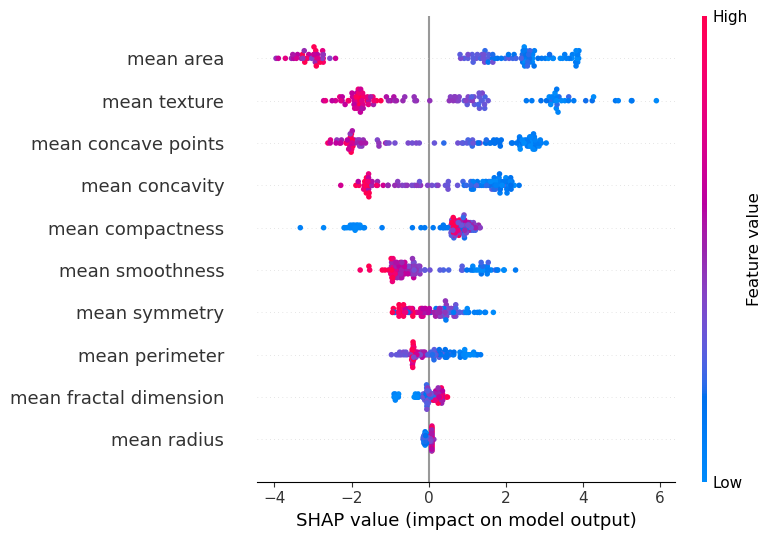

In [4]:
mask = shap.maskers.Independent(X_train_scaled)
xgb_explainer = shap.TreeExplainer(xgb_clf, data=X_train_scaled)
xgb_shap_values = xgb_explainer.shap_values(X_test_scaled)
xgb_shaps = xgb_explainer(X_test_scaled)

feature_names = df.columns
shap.summary_plot(xgb_shap_values, X_test_scaled, feature_names=feature_names)

In [40]:
#I trained the model on xgboost cause as i understand it, it can be even better than a neural network on tabular data, the performance is good, as shown by accuracy scores,
#and i could easily apply the explainer.
#I removed some features which I thought were redundant or hard to interpret, like the error or worst values. The model performed just as well without those values-slightly better.
#I balanced the data, since there were more '1' classes in the dataset.

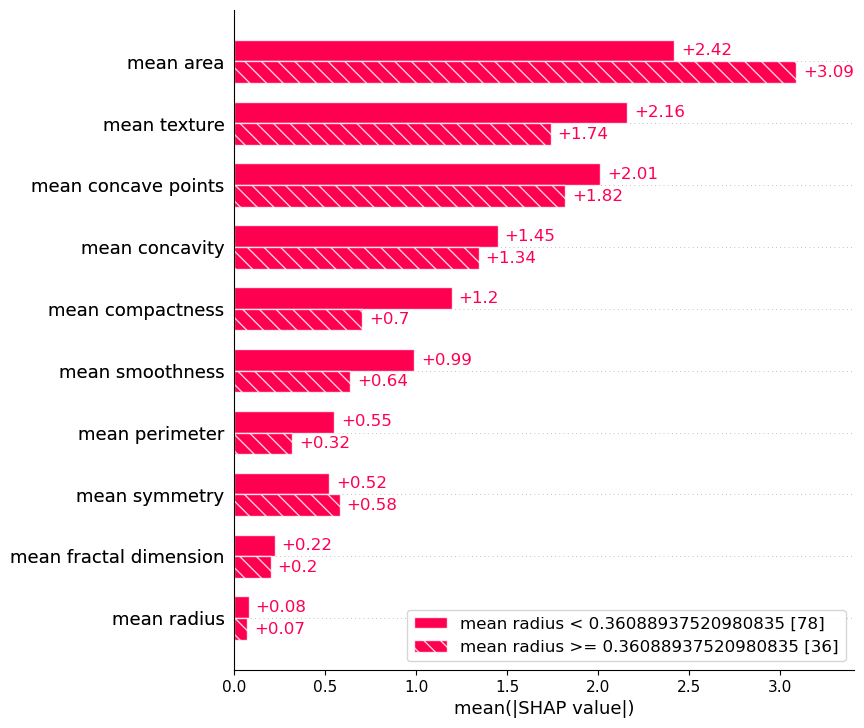

In [5]:
xgb_explainer = shap.TreeExplainer(xgb_clf, X_train_scaled, feature_names=df.columns)

xgb_shaps = xgb_explainer(X_test_scaled)

shap.plots.bar(xgb_shaps.cohorts(2).abs.mean(0))


In [42]:
#the highest contributor is the mean area (for a benign case), which means the roughness of the cell surface.
#The cohorts, provided a cutoff value for a prominent feature (this seems random actually), and show how features affect the final result.


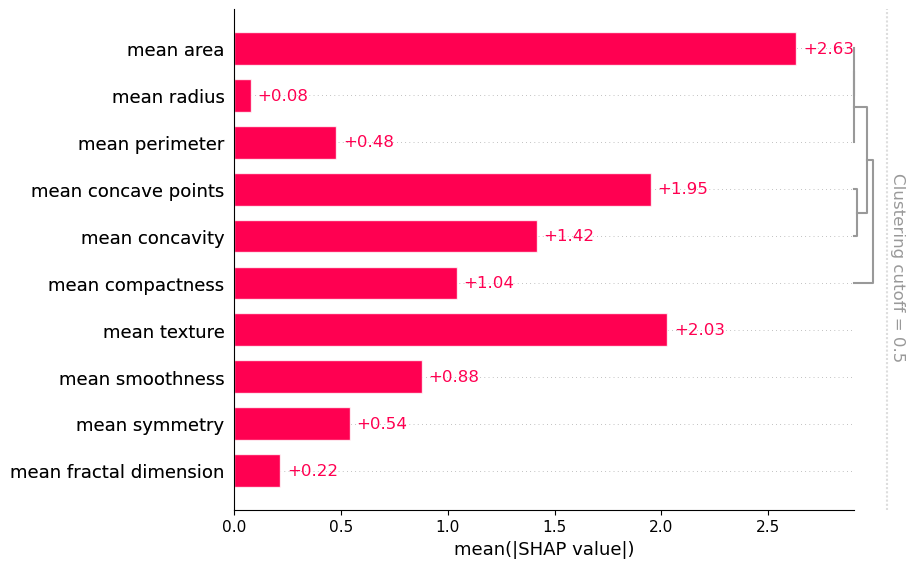

In [53]:
clustering = shap.utils.hclust(X_test_scaled, y_test)
shap.plots.bar(xgb_shaps, clustering=clustering, clustering_cutoff=0.5) # A higher cut off value means more independant and less redundant.

In [ ]:
#Looking at the features above they seem somewhat correlated, less independent, which makes sense since they describe similar qualities.

In [6]:
shap.initjs()
ind = 10
shap.force_plot(
    xgb_explainer.expected_value, xgb_shap_values[ind], X_test_scaled[ind,:],
    feature_names=df.columns
)

#below is one instance of the model, showing how the attributes have affected the decision, in this case, a benign tumor (higher score).


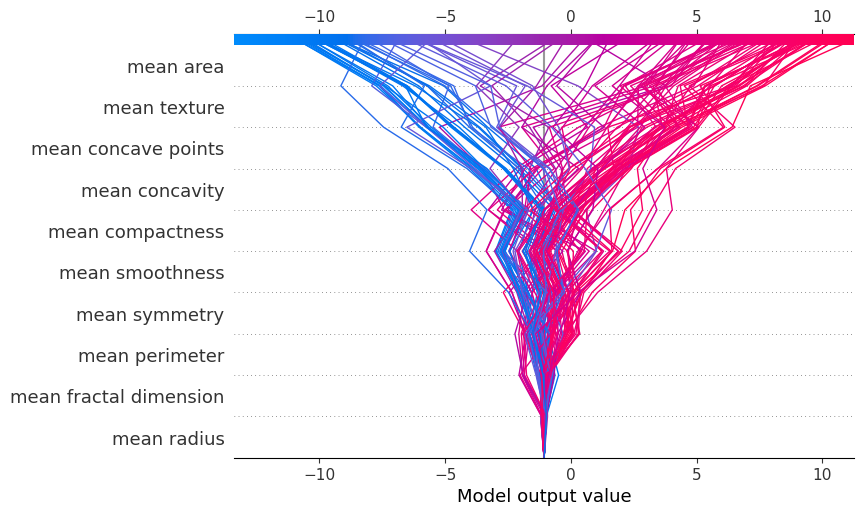

In [78]:
shap.decision_plot(xgb_explainer.expected_value, xgb_shap_values, df.columns)
#Below are all instances, showing the various pulls of the feature values towards a decision. 

In [ ]:
#From above, we can see that the mean area, mean texture, concavity etc, similar qualities, are the most important for deciding on the tumor status.

In [7]:
lime_explainer = lime.lime_tabular.LimeTabularExplainer(X_train_scaled , mode='classification', class_names=['Malignant', 'Benign'], feature_names = df.columns, 
                                                        kernel_width=4, 
                                                        verbose=False)

In [8]:
ind = 10
exp = lime_explainer.explain_instance(X_test_scaled[ind], xgb_clf.predict_proba, num_features=5)
exp.show_in_notebook()

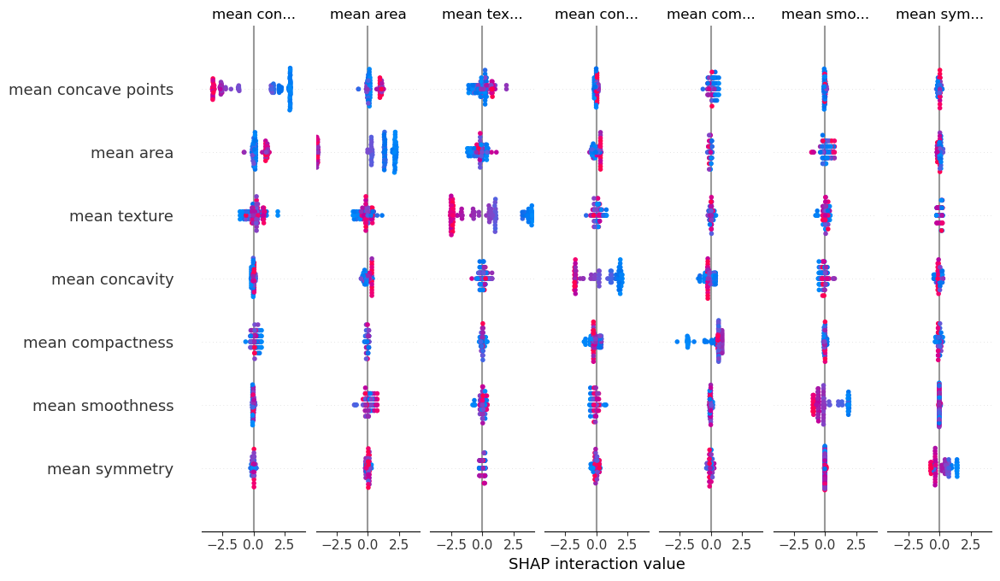

In [10]:
shap_interaction_values = shap.TreeExplainer(xgb_clf).shap_interaction_values(X_test_scaled)
shap.summary_plot(shap_interaction_values, X_test_scaled, feature_names=df.columns)

In [ ]:
#Above we can see the rules for this instance, factors contributing to one or other outcome. 

#some information on interpreting interactions of features, https://www.kaggle.com/code/wti200/analysing-interactions-with-shap 

#Below, optional, i am showing how recursive feature elimination with cross validation 
#can be used to automatically select the number of features and rank them on importance.
#This makes the model less interpretable, at least to me. For example the error should not be a feature.
#And then I show the tenth instance again.

Optimal number of features: 23
Selected features: ['mean texture', 'mean area', 'mean smoothness', 'mean compactness', 'mean concavity', 'mean concave points', 'mean fractal dimension', 'radius error', 'texture error', 'area error', 'compactness error', 'concavity error', 'concave points error', 'symmetry error', 'fractal dimension error', 'worst radius', 'worst texture', 'worst perimeter', 'worst area', 'worst smoothness', 'worst concavity', 'worst concave points', 'worst symmetry']
Training score with selected features: 1.0
Testing score with selected features: 0.956140350877193
Feature Importance Ranking:
f16: 24.0
f0: 21.0
f10: 21.0
f20: 18.0
f9: 15.0
f18: 15.0
f21: 13.0
f5: 12.0
f22: 12.0
f2: 11.0
f12: 11.0
f13: 11.0
f19: 10.0
f17: 8.0
f1: 7.0
f3: 7.0
f15: 7.0
f4: 5.0
f7: 5.0
f11: 4.0
f6: 2.0
f14: 2.0
f8: 1.0


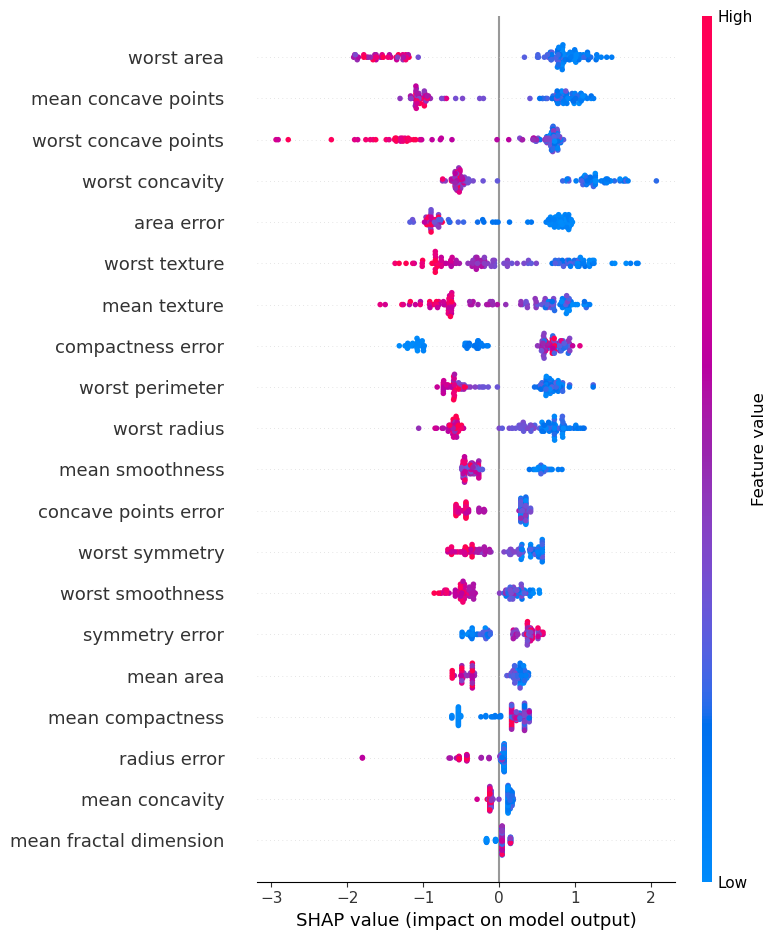

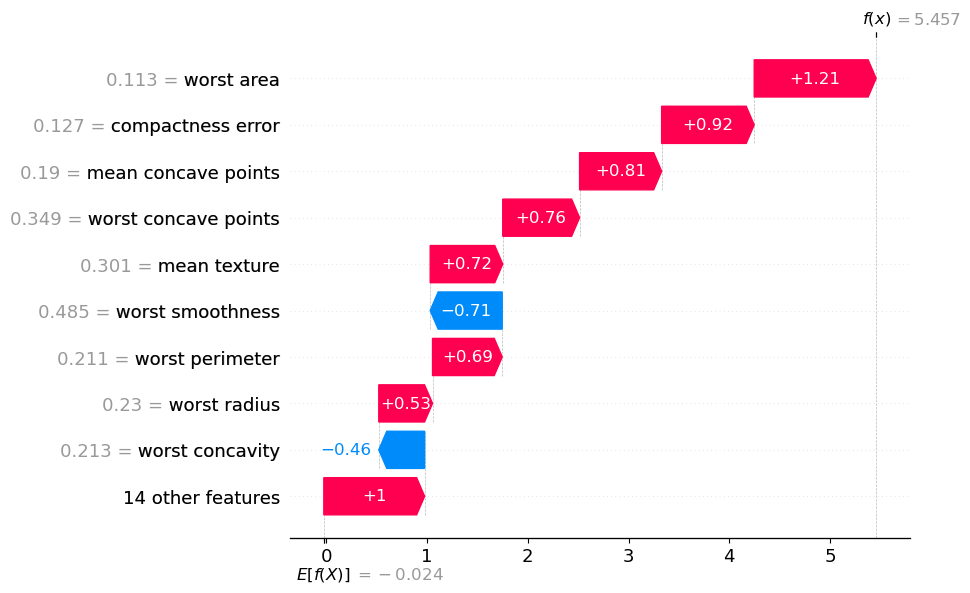

In [79]:
import pandas as pd
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from xgboost import XGBClassifier
from sklearn.feature_selection import RFECV
from imblearn.over_sampling import RandomOverSampler
import shap
import matplotlib.pyplot as plt

# Load the breast cancer dataset
dataset = load_breast_cancer()

# Convert the data to a DataFrame
df = pd.DataFrame(dataset['data'], columns=dataset['feature_names'])

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    df, dataset['target'], test_size=0.2, random_state=42
)

# Apply oversampling to balance the training set
oversampler = RandomOverSampler(random_state=42)
X_train_balanced, y_train_balanced = oversampler.fit_resample(X_train, y_train)

# Scale the features
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train_balanced)
X_test_scaled = scaler.transform(X_test)

# Initialize the XGBoost classifier for RFE with Cross-Validation (RFECV)
xgb_model = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.3,
    use_label_encoder=False,
    eval_metric='logloss',
    objective='binary:logistic'
)

# Use RFECV to find the optimal number of features
rfecv = RFECV(estimator=xgb_model, step=1, cv=5, scoring='accuracy')  # Using 5-fold cross-validation
rfecv.fit(X_train_scaled, y_train_balanced)

# Determine the selected features
selected_features = rfecv.support_
selected_feature_names = df.columns[selected_features]

print("Optimal number of features:", rfecv.n_features_)
print("Selected features:", list(selected_feature_names))

# Create new training and test sets with selected features
X_train_selected = X_train_scaled[:, selected_features]
X_test_selected = X_test_scaled[:, selected_features]

# Re-train the XGBoost model with the selected features
xgb_clf = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.3,
    use_label_encoder=False,
    eval_metric='logloss',
    objective='binary:logistic'
)

xgb_clf.fit(X_train_selected, y_train_balanced)

# Evaluate the model with the selected features
train_accuracy = xgb_clf.score(X_train_selected, y_train_balanced)
test_accuracy = xgb_clf.score(X_test_selected, y_test)

print("Training score with selected features:", train_accuracy)
print("Testing score with selected features:", test_accuracy)

# Display feature importance
feature_importance = xgb_clf.get_booster().get_fscore()
sorted_features = sorted(feature_importance.items(), key=lambda x: x[1], reverse=True)

print("Feature Importance Ranking:")
for feature, importance in sorted_features:
    print(f"{feature}: {importance}")

# Use SHAP for explainability
explainer = shap.TreeExplainer(xgb_clf)
shap_values = explainer.shap_values(X_test_selected)

# Summary plot showing feature impact
shap.summary_plot(shap_values, X_test_selected, feature_names=list(selected_feature_names))

# Waterfall plot for a specific instance
shap.waterfall_plot(shap.Explanation(values=shap_values[0], base_values=explainer.expected_value, data=X_test_selected[0], feature_names=list(selected_feature_names)))


In [82]:
# Initialize the LIME explainer for tabular data
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train_selected,
    feature_names=list(selected_feature_names),
    class_names=['Malignant', 'Benign'],  # Class names
    discretize_continuous=True,
    mode='classification'
)

# Explain an instance from the test set
instance_to_explain = X_test_selected[10]
explanation = lime_explainer.explain_instance(
    instance_to_explain,
    xgb_clf.predict_proba,
    num_features=5  # Number of features to include in the explanation
)

# Show the explanation in a Jupyter notebook
explanation.show_in_notebook(show_table=True, show_all=False)